# Imports

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
import tensorflow as tf
import os
from PIL import Image
from keras.utils import img_to_array
from sklearn.model_selection import train_test_split
import visualkeras
from keras.utils import plot_model

c:\Users\Asus\AppData\Local\Programs\Python\Python310\lib\site-packages\requests\__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.7) or chardet (5.1.0)/charset_normalizer (2.0.6) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


In [15]:
DATA_PATH = "./landscape Images"
clr_path = DATA_PATH + "/color/"
gry_path = DATA_PATH + "/gray/"

# Data Loading & Dataset Creation

In [16]:
clr_img_path = []
gry_img_path = []

for img_path in os.listdir(clr_path) :
    clr_img_path.append(os.path.join(clr_path, img_path))
    
for img_path in os.listdir(gry_path) :
    gry_img_path.append(os.path.join(gry_path, img_path))

In [17]:
clr_img_path.sort()
gry_img_path.sort()

In [18]:
clr_img_path[:10]

['./landscape Images/color/0.jpg',
 './landscape Images/color/1.jpg',
 './landscape Images/color/10.jpg',
 './landscape Images/color/100.jpg',
 './landscape Images/color/1000.jpg',
 './landscape Images/color/1001.jpg',
 './landscape Images/color/1002.jpg',
 './landscape Images/color/1003.jpg',
 './landscape Images/color/1004.jpg',
 './landscape Images/color/1005.jpg']

In [19]:
gry_img_path[:10]

['./landscape Images/gray/0.jpg',
 './landscape Images/gray/1.jpg',
 './landscape Images/gray/10.jpg',
 './landscape Images/gray/100.jpg',
 './landscape Images/gray/1000.jpg',
 './landscape Images/gray/1001.jpg',
 './landscape Images/gray/1002.jpg',
 './landscape Images/gray/1003.jpg',
 './landscape Images/gray/1004.jpg',
 './landscape Images/gray/1005.jpg']

In [20]:
X = []
y = []

for i in range(5000) :
    img1 = cv2.cvtColor(cv2.imread(clr_img_path[i]), cv2.COLOR_BGR2RGB)
    img2 = cv2.cvtColor(cv2.imread(gry_img_path[i]), cv2.COLOR_BGR2RGB)
    
    y.append(img_to_array(Image.fromarray(cv2.resize(img1,(128,128)))))
    X.append(img_to_array(Image.fromarray(cv2.resize(img2,(128,128)))))

X = np.array(X)     
y = np.array(y)

print(X.min())
print(X.max())

print(y.min())
print(y.max())

0.0
255.0
0.0
255.0


# Exploratory Data Analysis

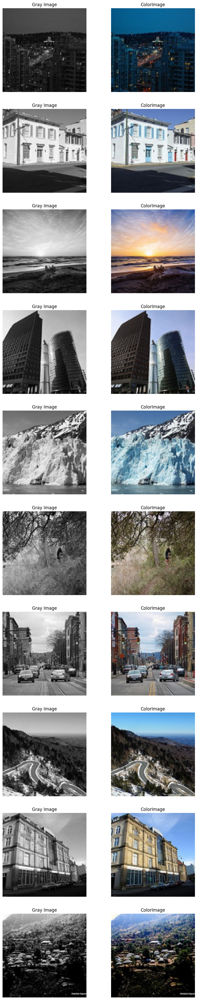

In [21]:
plt.figure(figsize = (10,50))
i = 0
while i < 20:
    x = np.random.randint(0,3000)
    plt.subplot(10, 2, i+1)
    plt.imshow(X[x]/255.0,'gray')
    plt.axis('off')
    plt.title('Gray Image')
    
    plt.subplot(10, 2, i+2)
    plt.imshow(y[x]/ 255.0)
    plt.axis('off')
    plt.title('ColorImage')
    i += 2
plt.show()

# Data Scaling Transformation

In [22]:
X = (X/127.5) - 1
y = (y/127.5) - 1

In [23]:
print(X.shape)
print(y.shape)
print(f'Minimum of X : {X.min()}')
print(f'Maximum of X : {X.max()}')
print(f'Minimum of y : {y.min()}')
print(f'Maximum of y : {y.max()}')

(5000, 128, 128, 3)
(5000, 128, 128, 3)
Minimum of X : -1.0
Maximum of X : 1.0
Minimum of y : -1.0
Maximum of y : 1.0


# Splitting Data

In [24]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.15, shuffle = False, random_state=1337)
print(X_train.shape)
print(y_train.shape)
print(X_valid.shape)
print(y_valid.shape)

(4250, 128, 128, 3)
(4250, 128, 128, 3)
(750, 128, 128, 3)
(750, 128, 128, 3)


# Model

In [25]:
from tensorflow_addons.layers import SpectralNormalization
from keras.layers import BatchNormalization
from keras.layers import ZeroPadding2D
from keras.layers import Concatenate
from keras.layers import Activation
from keras.models import Model
from keras.layers import Dense
from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import LeakyReLU
from keras.layers import Conv2DTranspose
from keras.initializers import RandomNormal
from tensorflow_addons.layers import InstanceNormalization

c:\Users\Asus\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [26]:
# Weight Initialization
'''
Weigth initialization using random distribution with mean of 0 and standard deviation of 0.02.
'''

init = RandomNormal(mean = 0.0, stddev = 0.02)

## PatchGAN Discriminator
### D & U Blocks

In [43]:
def d_block (x_input, filters, strides, padding, batch_norm, inst_norm) :
    
    x = Conv2D(filters, (4, 4),
               strides=strides,
               padding=padding,
               use_bias= False,
               kernel_initializer = init)(x_input)
    
    '''
    SpectralNormalization is wrapped around convolution layer.
    Also, Instance  and  Batch Normalization layers are added.
    '''
    
    if batch_norm == True :
        x = BatchNormalization   ()(x)
    if inst_norm  == True :
        x = InstanceNormalization()(x)
    x = LeakyReLU(0.2)(x)
    return x

def u_block (x, skip, filters, strides, padding, batch_norm, inst_norm) :
    
    x = Conv2DTranspose(filters, (4, 4),
                        strides=strides,
                        padding=padding,
                        use_bias= False,
                        kernel_initializer = init)(x)
    
    '''
    All the 3 normalizations applied here as well.
    '''
    
    if batch_norm == True :
        x = BatchNormalization   ()(x)
    if inst_norm  == True :
        x = InstanceNormalization()(x)
    x = ReLU()(x)
    conc_x = Concatenate()([x , skip])
    
    return conc_x

### PatchGAN

In [44]:
def PatchGAN (image_shape) :
    genI = Input(shape =  image_shape)
    tarI = Input(shape =  image_shape)
    conc = Concatenate()([genI, tarI])
    
    c064 = d_block(conc, 2**6, 2, 'same', False, False)
    c128 = d_block(c064, 2**7, 2, 'same', False, True )
    c256 = d_block(c128, 2**8, 2, 'same', True , False)
    
    temp = ZeroPadding2D()(c256)
    
    c512 = d_block(temp, 2**9, 1,'valid', True , False)
    
    temp = ZeroPadding2D()(c512)
    
    c001 = Conv2D(2**0, (4,4), strides=1, padding = 'valid', activation = 'sigmoid', kernel_initializer=init)(temp)
    
    model = Model(inputs = [genI, tarI], outputs = c001)
    return model

In [45]:
d_model = PatchGAN((128,128,3,))
d_model.compile()
d_model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_12 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_16 (Concatenate)   (None, 128, 128, 6)  0           ['input_11[0][0]',               
                                                                  'input_12[0][0]']         

In [46]:
plot_model(d_model, './discriminator_2.png', show_shapes = True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


## U-Net Generator

In [47]:
def mod_Unet () :
    srcI = Input(shape = (128,128,3,))
    # Contracting path
    c064 = d_block(srcI, 2**6, 2, 'same', False, False) # _______________________.
    c128 = d_block(c064, 2**7, 2, 'same', True , False) # ____________________.  .
    c256 = d_block(c128, 2**8, 2, 'same', True , False) # _________________.  .  .
    c512 = d_block(c256, 2**9, 2, 'same', True , False) # ______________.  .  .  .
    d512 = d_block(c512, 2**9, 2, 'same', True , False) # ___________.  .  .  .  .
    e512 = d_block(d512, 2**9, 2, 'same', True , False) # ________.  .  .  .  .  .
                                                        #         .  .  .  .  .  .
    # Bottleneck layer                                            .  .  .  .  .  .
                                                        #         .  .  .  .  .  .
    f512 = d_block(e512, 2**9, 2, 'same', True , False) #         .  .  .  .  .  .
                                                        #         .  .  .  .  .  .
    # Expanding  path                                             .  .  .  .  .  .
                                                        #         .  .  .  .  .  .
    u512 = u_block(f512, e512, 2**9, 2, 'same', True, False)# ____.  .  .  .  .  .
    u512 = u_block(u512, d512, 2**9, 2, 'same', True, False)# _______.  .  .  .  .
    u512 = u_block(u512, c512, 2**9, 2, 'same', True, False)# __________.  .  .  .
    u256 = u_block(u512, c256, 2**8, 2, 'same', True, False)# _____________.  .  .
    u128 = u_block(u256, c128, 2**7, 2, 'same', True, False)# ________________.  .
    u064 = u_block(u128, c064, 2**6, 2, 'same', False, True)# ___________________.
    
    genI = Conv2DTranspose(3, (4,4), strides = 2, padding = 'same', activation = 'tanh', kernel_initializer = init)(u064)
    
    model = Model(inputs = srcI, outputs = genI)
    return model

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_39 (Conv2D)             (None, 64, 64, 64)   3072        ['input_13[0][0]']               
                                                                                                  
 leaky_re_lu_34 (LeakyReLU)     (None, 64, 64, 64)   0           ['conv2d_39[0][0]']              
                                                                                                  
 conv2d_40 (Conv2D)             (None, 32, 32, 128)  131072      ['leaky_re_lu_34[0][0]']   

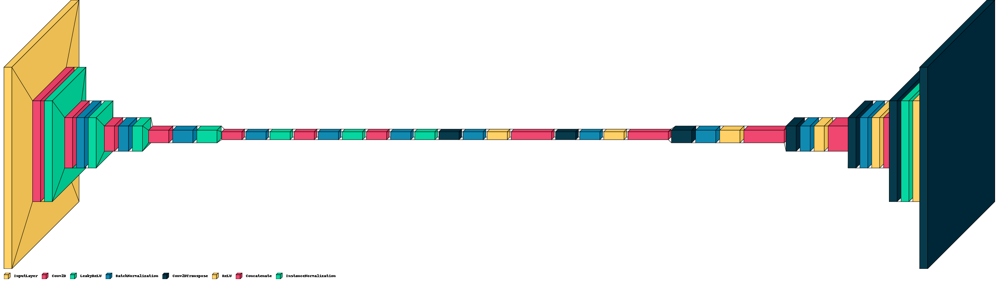

In [48]:
g_model = mod_Unet()
g_model.compile()
g_model.summary()
def visual_keras_draw_model_architecture(model):    
    return visualkeras.layered_view(model,legend=True, draw_volume=True, to_file='generator.png')

visual_keras_draw_model_architecture(g_model)

In [49]:
plot_model(g_model, './generator_2.png', show_shapes = True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


# Tensorflow Datasets Creation

In [51]:
LAMBDA = 50
BATCH_SIZE = 16
BUFFER_SIZE  = 50

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
valid_dataset = tf.data.Dataset.from_tensor_slices((X_valid, y_valid))

train_dataset = train_dataset.shuffle(buffer_size=BUFFER_SIZE).batch(batch_size=BATCH_SIZE)
valid_dataset = valid_dataset.shuffle(buffer_size=BUFFER_SIZE).batch(batch_size=BATCH_SIZE)

## Loading Models

In [52]:
gen0 = mod_Unet()

dis0 = PatchGAN((128,128,3,)) # (W//1) x (H//1)
dis1 = PatchGAN((64, 64, 3,)) # (W//2) x (H//2)
dis2 = PatchGAN((32, 32, 3,)) # (W//4) x (H//4)

## Losses

In [53]:
bin_entropy = keras.losses.BinaryCrossentropy(from_logits = True)

def gen_loss (dis_gen_output, target_image, gen_output) :
    
    ad_loss = bin_entropy(tf.ones_like (dis_gen_output) ,  dis_gen_output)
    l1_loss = tf.reduce_mean(tf.abs(tf.subtract(target_image,gen_output)))
    
    '''
    Total loss = adversarial +  (LAMBDA*L1)
    '''
    total_loss = ad_loss + (LAMBDA*l1_loss)
    
    return total_loss, ad_loss, l1_loss

def dis_loss (dis_gen_output, dis_tar_output) :
    
    gen_loss = bin_entropy(tf.zeros_like(dis_gen_output), dis_gen_output)
    tar_loss = bin_entropy(tf.ones_like (dis_tar_output), dis_tar_output)
    
    total_dis_loss = gen_loss + tar_loss
    return total_dis_loss

## Optimizers

In [54]:
g_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5, beta_2=0.999)
d0optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5, beta_2=0.999)
d1optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5, beta_2=0.999)
d2optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5, beta_2=0.999)

# Training

In [55]:
@tf.function
def train_on_batch (b_w_image, tar_image) :
    
    with tf.GradientTape(persistent = True) as  g :
        
        '''
        Image Tensors
        '''
        gen_image = gen0(b_w_image, training=True)
        
        # 128x128
        dis_tar_output_128 = dis0([b_w_image, tar_image], training = True)
        dis_gen_output_128 = dis0([b_w_image, gen_image], training = True)
        
        
        tar_image_128 = tar_image
        gen_image_128 = gen_image
        
        tar_image = tf.image.resize(tar_image, [64,64])
        b_w_image = tf.image.resize(b_w_image, [64,64])
        gen_image = tf.image.resize(gen_image, [64,64])
        
        # 064x064
        dis_tar_output_064 = dis1([b_w_image, tar_image], training = True)
        dis_gen_output_064 = dis1([b_w_image, gen_image], training = True)
        
        tar_image_064 = tar_image
        gen_image_064 = gen_image
        
        tar_image = tf.image.resize(tar_image, [32,32])
        b_w_image = tf.image.resize(b_w_image, [32,32])
        gen_image = tf.image.resize(gen_image, [32,32])
        
        # 032x032
        dis_tar_output_032 = dis2([b_w_image, tar_image], training = True)
        dis_gen_output_032 = dis2([b_w_image, gen_image], training = True)
        
        tar_image_032 = tar_image
        gen_image_032 = gen_image
        
        '''
        LOSS
        '''
        
        # 128x128
        g_loss_128, _, _ = gen_loss(dis_gen_output_128, tar_image_128, gen_image_128)
        d_loss_128 = dis_loss(dis_gen_output_128, dis_tar_output_128)
        
        # 064x064
        g_loss_064, _, _ = gen_loss(dis_gen_output_064, tar_image_064, gen_image_064)
        d_loss_064 = dis_loss(dis_gen_output_064, dis_tar_output_064)
        
        # 032x032
        g_loss_032, _, _ = gen_loss(dis_gen_output_032, tar_image_032, gen_image_032)
        d_loss_032 = dis_loss(dis_gen_output_032, dis_tar_output_032)
        
        
        g_total_loss = g_loss_128 + g_loss_064 + g_loss_032
        d_total_loss = d_loss_128 + d_loss_064 + d_loss_032
    
    # compute gradients
    g_gradients = g.gradient(g_total_loss, gen0.trainable_variables) # generatorLoss
    
    d0gradients = g.gradient(d_loss_128, dis0.trainable_variables)   # dis loss 128
    d1gradients = g.gradient(d_loss_064, dis1.trainable_variables)   # dis loss 064
    d2gradients = g.gradient(d_loss_032, dis2.trainable_variables)   # dis loss 032
    
    
    # apply gradient descent
    g_optimizer.apply_gradients(zip(g_gradients, gen0.trainable_variables))
    
    d0optimizer.apply_gradients(zip(d0gradients, dis0.trainable_variables))
    d1optimizer.apply_gradients(zip(d1gradients, dis1.trainable_variables))
    d2optimizer.apply_gradients(zip(d2gradients, dis2.trainable_variables))

In [56]:
for global_b_w_image, global_tar_image in train_dataset.take(1) :
    pass

In [57]:
import os
os.system("mkdir training_images")

1

In [58]:

def fig (b_w_image, gen_image, tar_image, epoch) :
    plt.figure(figsize = (20, 20))
    
    plt.subplot(1,3,1)
    plt.imshow((b_w_image[0] + 1.0) / 2.0)
    plt.title('BandW Image',fontsize = 20)
    plt.axis('off')
    
    plt.subplot(1,3,2)
    plt.imshow((gen_image[0] + 1.0) / 2.0)
    plt.title('GenerateImg',fontsize = 20)
    plt.axis('off')
    
    plt.subplot(1,3,3)
    plt.imshow((tar_image[0] + 1.0) / 2.0)
    plt.title('Colored Img',fontsize = 20)
    plt.axis('off')
    plt.show()
    plt.savefig("/content/training_images/Epoch_" + str(epoch) + ".jpg")

def fit (EPOCHS = 2) :
    for epoch in range(EPOCHS) :
        print(f'Epoch {epoch} out of {EPOCHS}')
        
        for n, (b_w_image, tar_image) in train_dataset.enumerate() :
            if n ==  265 :
                print('#....End')
            if n%20 == 0 :
                print('#',end='')
            train_on_batch(b_w_image, tar_image)
        
        if epoch%3  == 0 :
            gen0.save('./gen0.h5')
            global_gen_image = gen0(global_b_w_image,training = True)
            fig(global_b_w_image, global_gen_image, global_tar_image, epoch)

Epoch 0 out of 2


###############....End


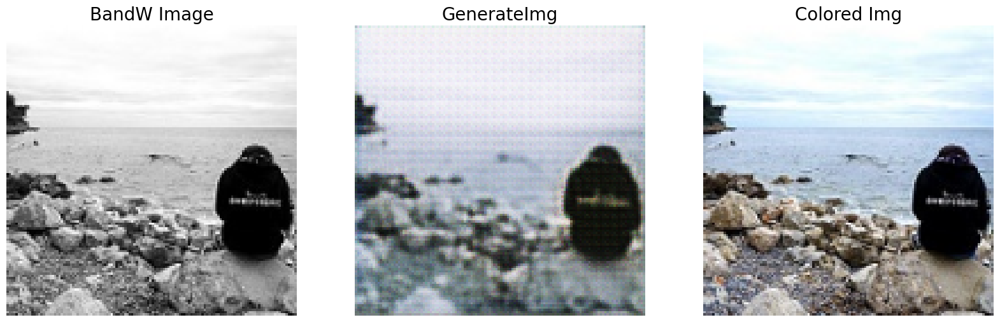

FileNotFoundError: [Errno 2] No such file or directory: '/content/training_images/Epoch_0.jpg'

<Figure size 640x480 with 0 Axes>

In [59]:
fit(EPOCHS = 2)

# Prediction

In [ ]:
def fig (b_w_image, gen_image, tar_image) :
    plt.figure(figsize = (20, 20))
    
    plt.subplot(1,3,1)
    plt.imshow((b_w_image[0] + 1.0) / 2.0)
    plt.title('BandW Image',fontsize = 20)
    plt.axis('off')
    
    plt.subplot(1,3,2)
    plt.imshow((gen_image[0] + 1.0) / 2.0)
    plt.title('GenerateImg',fontsize = 20)
    plt.axis('off')
    
    plt.subplot(1,3,3)
    plt.imshow((tar_image[0] + 1.0) / 2.0)
    plt.title('Colored Img',fontsize = 20)
    plt.axis('off')
    plt.show()

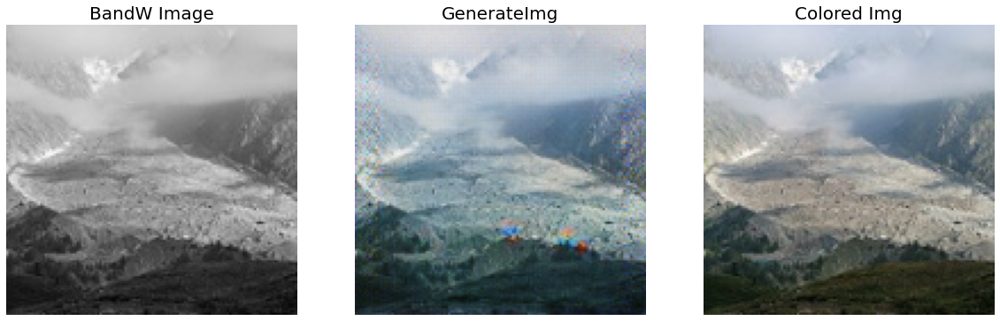

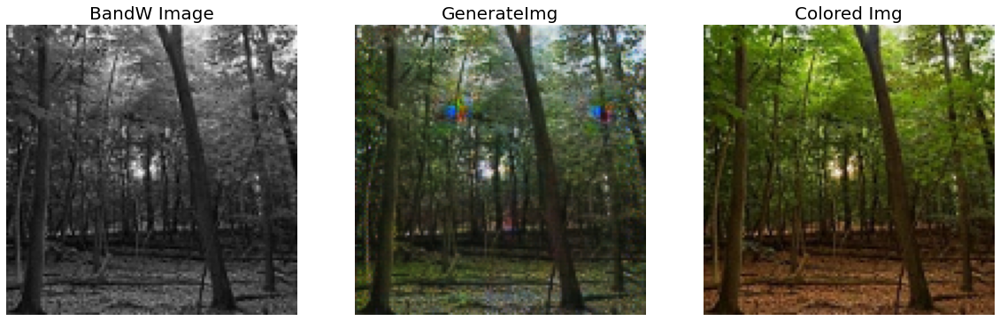

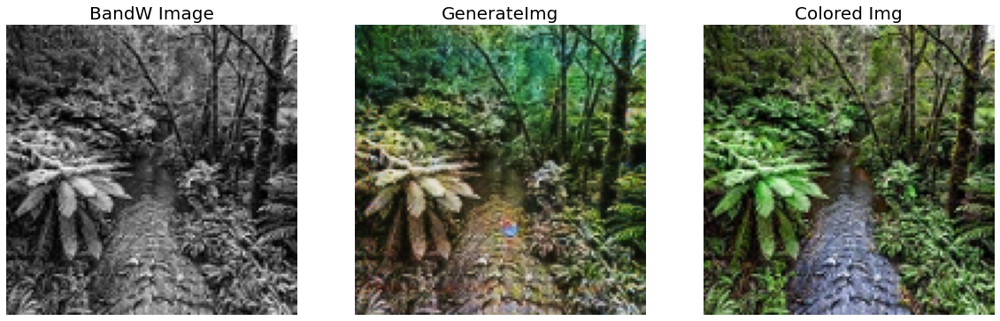

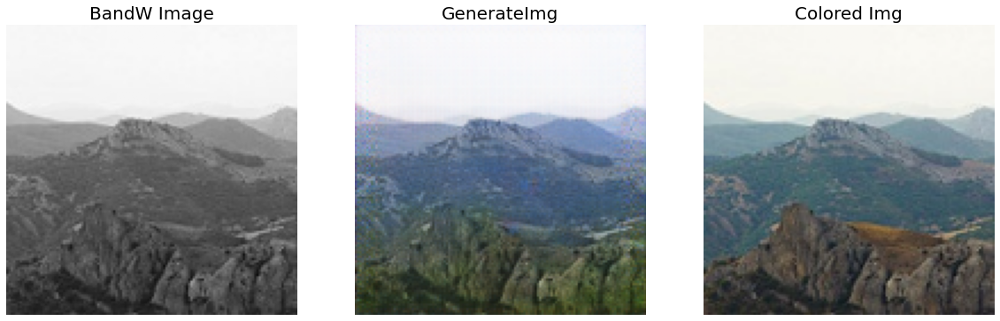

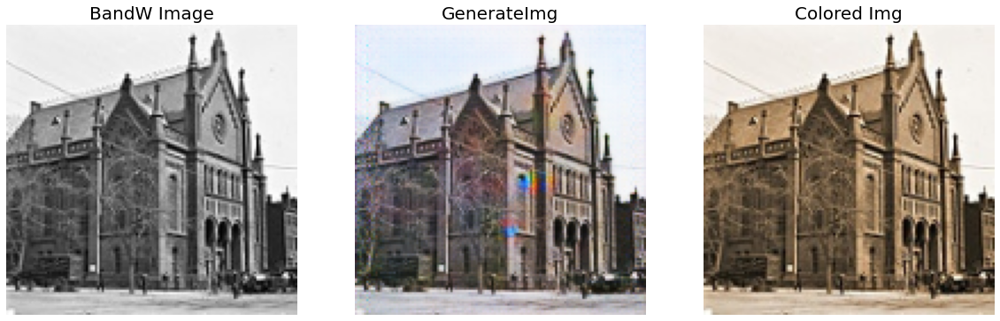

...

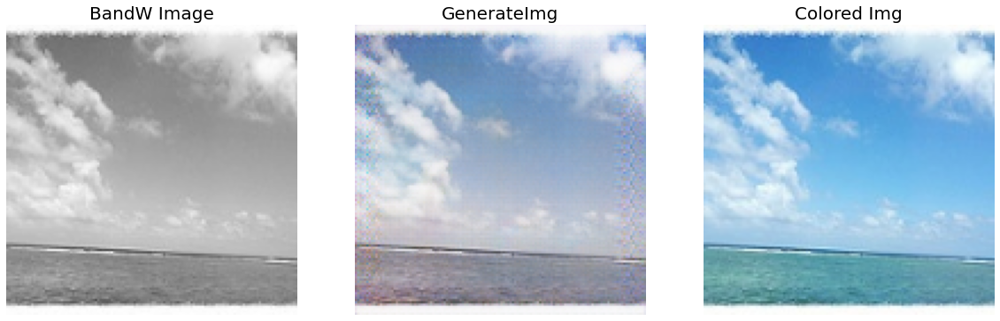

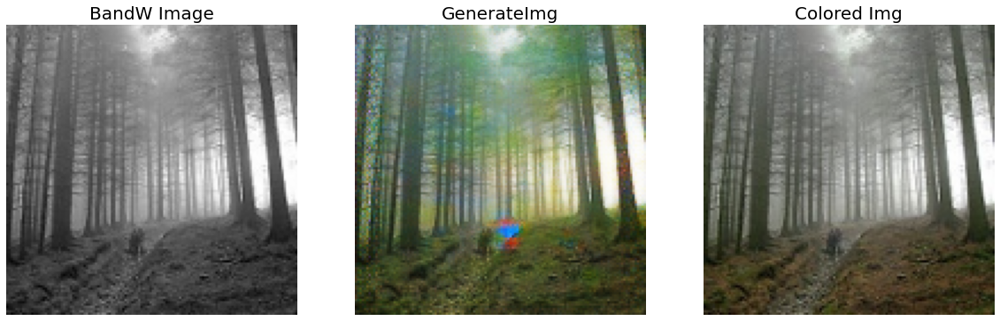

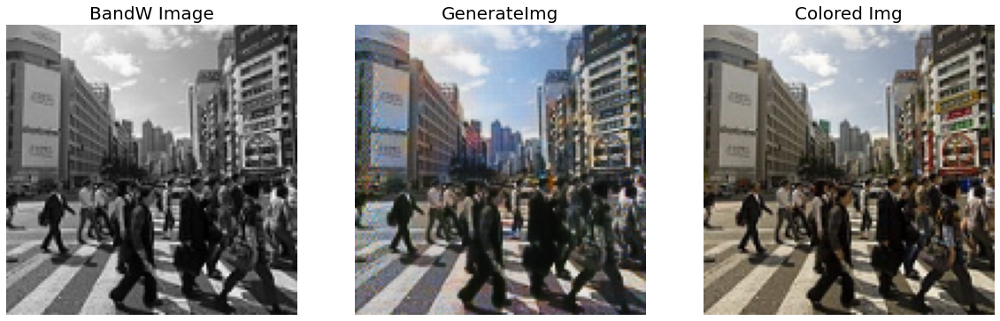

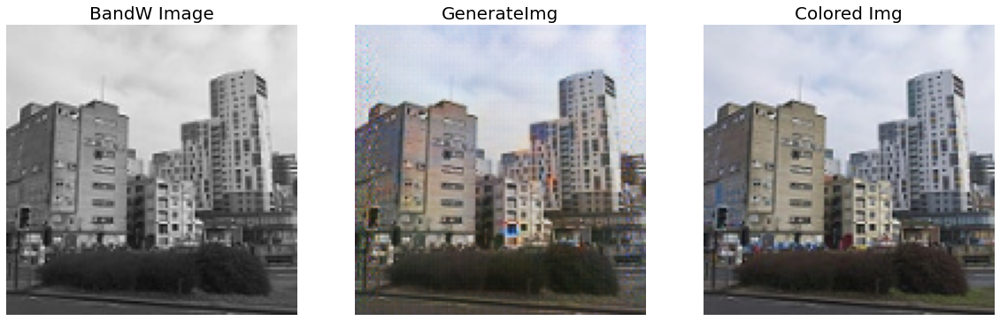

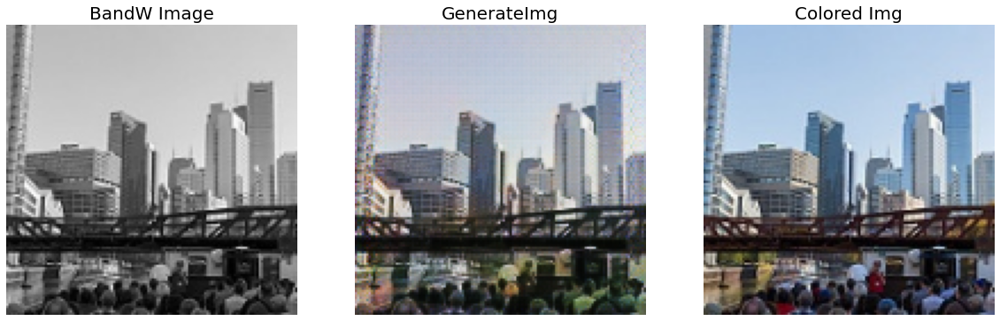

In [ ]:
for b_w_image,tar_image in valid_dataset.take(20) :
    gen_image = gen0(b_w_image , training = True)
    fig(b_w_image, gen_image, tar_image)

# Saving Models

In [ ]:
gen0.save('./gen0.h5')
dis0.save('./dis0.h5')
dis1.save('./dis1.h5')
dis2.save('./dis2.h5')